# Contrastive Language-Image Pre-training

This demo is based on the excellent tutorial [here](https://towardsdatascience.com/simple-implementation-of-openai-clip-model-a-tutorial-ace6ff01d9f2).

In this demo, we implement Contrastive Language-Image Pre-training (CLIP). At a high level, CLIP embeds images and text pairs to a small latent space. The goal is to make the embeddings of image and text pairs similar to each other. In this way, we want the embeddings to capture meaning which *transcends* the difference between language and images.

We achieve this goal by encouraging the embedded text and image pair to have high inner product while keeping the inner product of texts and images that are not pairs low.

CLIP has been an important component of the break through generative models including Stable Diffusion.

## Dependencies

We'll need a few dependencies to get started.

In [3]:
# !pip install timm
# !pip install transformers
# !pip install opencv-python
# !pip install pandas
# !pip install albumentations
# !pip install matplotlib

In [4]:
import os
import cv2
import gc
import numpy as np
import pandas as pd
import itertools
from tqdm.autonotebook import tqdm
import albumentations as A
import matplotlib.pyplot as plt
import torch
from torch import nn
import torch.nn.functional as F
import timm
from transformers import DistilBertModel, DistilBertConfig, DistilBertTokenizer
from transformers import BertModel, BertConfig, BertTokenizer
from transformers import RobertaModel, RobertaConfig, RobertaTokenizer

/tmp/ipykernel_31/4177578546.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
2025-05-04 14:37:54.758204: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746369474.955123      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746369475.009259      31 cuda_blas.cc:1418] Unable to register

I've been unable to load Flickr8 through pytorch. Instead, we'll use kaggle (we'll need to link a free account to the download).

In [5]:
!pip install kaggle --upgrade
os.environ['KAGGLE_USERNAME'] = ''
os.environ['KAGGLE_KEY'] = ''

### For Flickr 8k
!kaggle datasets download -d adityajn105/flickr8k
!unzip flickr8k.zip

Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k
License(s): CC0-1.0
Archive:  flickr8k.zip
  inflating: Images/1000268201_693b08cb0e.jpg  
  inflating: Images/1001773457_577c3a7d70.jpg  
  inflating: Images/1002674143_1b742ab4b8.jpg  
  inflating: Images/1003163366_44323f5815.jpg  
  inflating: Images/1007129816_e794419615.jpg  
  inflating: Images/1007320043_627395c3d8.jpg  
  inflating: Images/1009434119_febe49276a.jpg  
  inflating: Images/1012212859_01547e3f17.jpg  
  inflating: Images/1015118661_980735411b.jpg  
  inflating: Images/1015584366_dfcec3c85a.jpg  
  inflating: Images/101654506_8eb26cfb60.jpg  
  inflating: Images/101669240_b2d3e7f17b.jpg  
  inflating: Images/1016887272_03199f49c4.jpg  
  inflating: Images/1019077836_6fc9b15408.jpg  
  inflating: Images/1019604187_d087bf9a5f.jpg  
  inflating: Images/1020651753_06077ec457.jpg  
  inflating: Images/1022454332_6af2c1449a.jpg  
  inflating: Images/1022454428_b6b660a67b.jpg  
  inflating: Images/102297572

## Hyperparameters

We will use the following hyperparameters.

In [22]:
# Define configurations for our three models
class ModelConfig:
    def __init__(self, 
                 model_name='resnet18', 
                 text_encoder_model="distilbert-base-uncased",
                 text_tokenizer="distilbert-base-uncased",
                 image_embedding=512,
                 text_embedding=768):
        # ====== General training parameters ======
        self.debug = False  # Flag for enabling debug mode
        self.image_path = "/kaggle/working/Images"  # Path to the directory containing images
        self.captions_path = "/kaggle/working"  # Path to the directory containing captions file
        self.batch_size = 32  # Batch size for training
        self.num_workers = 2  # Number of subprocesses for data loading
        self.head_lr = 1e-3  # Learning rate for the projection head
        self.image_encoder_lr = 1e-4  # Learning rate for the image encoder
        self.text_encoder_lr = 1e-5  # Learning rate for the text encoder
        self.weight_decay = 1e-3  # Weight decay for regularization
        self.patience = 1  # Patience for learning rate scheduler
        self.factor = 0.8  # LR scheduler reduction factor
        self.epochs = 5  # Number of training epochs
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use GPU if available
        
        # ====== Model architecture parameters ======
        self.model_name = model_name  # Name of the image encoder model (e.g., resnet18, resnet34, etc.)
        self.image_embedding = image_embedding  # Dimensionality of image feature embeddings
        self.text_encoder_model = text_encoder_model  # Pretrained text encoder model
        self.text_embedding = text_embedding  # Dimensionality of text feature embeddings
        self.text_tokenizer = text_tokenizer  # Tokenizer corresponding to the text encoder
        self.max_length = 200  # Maximum length of tokenized text sequences
        
        self.pretrained = True  # Flag to use pretrained weights for both encoders
        self.trainable = True   # Whether to fine-tune the encoders or freeze them
        self.temperature = 1.0  # Temperature parameter for contrastive loss (e.g., CLIP-style models)
        
        # ====== Input and projection settings ======
        self.size = 224  # Input image size (used for resizing)
        
        # Projection head parameters (applied to both image and text embeddings before similarity computation)
        self.num_projection_layers = 1  # Number of layers in projection head
        self.projection_dim = 256  # Dimensionality of the projected embedding
        self.dropout = 0.1  # Dropout rate used in projection head


# Define our three model configurations with different encoder combinations
config1 = ModelConfig(
    model_name='resnet18',  # Lightweight ResNet architecture
    text_encoder_model="distilbert-base-uncased",  # Smaller and faster transformer model
    text_tokenizer="distilbert-base-uncased",
    image_embedding=512,
    text_embedding=768
)

config2 = ModelConfig(
    model_name='resnet34',  # Medium-sized ResNet
    text_encoder_model="bert-base-uncased",  # Standard BERT model
    text_tokenizer="bert-base-uncased",
    image_embedding=512,  
    text_embedding=768
)

config3 = ModelConfig(
    model_name='resnet50',  # Deeper ResNet with larger feature output
    text_encoder_model="roberta-base",  # Another powerful transformer model
    text_tokenizer="roberta-base",
    image_embedding=2048,  # ResNet50 outputs larger feature maps
    text_embedding=768
)

## Dataset

Whenever we work with text and images, we'll need to do a bit of tedious preprocessing. Here, we'll have to tokenize the sentence descriptions of images before passing them through an embedding and apply a transform to the images before loading them.

In [23]:
class CLIPDataset(torch.utils.data.Dataset):
    def __init__(self, image_filenames, captions, tokenizer, transforms, config):
        """
        Custom Dataset for CLIP-style training, where each image is paired with a caption.

        Args:
            image_filenames (List[str]): List of image filenames. Should be repeated if 
                                         multiple captions exist per image.
            captions (List[str]): List of captions (one per image entry).
            tokenizer: Pretrained tokenizer (e.g., from Hugging Face Transformers).
            transforms: Albumentations or torchvision-style transformation pipeline.
            config (ModelConfig): Configuration object containing paths and hyperparameters.
        """
        self.image_filenames = image_filenames
        self.captions = list(captions)

        # Tokenize all captions at once with padding and truncation
        self.encoded_captions = tokenizer(
            list(captions), padding=True, truncation=True, max_length=config.max_length
        )

        self.transforms = transforms  # Image preprocessing transforms
        self.config = config  # Access to global config (e.g., image path, max length, etc.)

    def __getitem__(self, idx):
        """
        Returns a dictionary containing:
            - tokenized caption tensors
            - transformed image tensor
            - raw caption text (optional for debugging or visualization)
        """
        # Extract the tokenized caption (input_ids, attention_mask, etc.)
        item = {
            key: torch.tensor(values[idx])
            for key, values in self.encoded_captions.items()
        }

        # Load image from file path
        image = cv2.imread(f"{self.config.image_path}/{self.image_filenames[idx]}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

        # Apply preprocessing/transforms (resize, normalize, augment, etc.)
        image = self.transforms(image=image)['image']

        # Convert to tensor format and reshape to (C, H, W)
        item['image'] = torch.tensor(image).permute(2, 0, 1).float()

        # Also return raw caption string (useful for evaluation or logging)
        item['caption'] = self.captions[idx]

        return item

    def __len__(self):
        # Returns the total number of (image, caption) pairs
        return len(self.captions)

## Embeddings

We'll need a way of encoding the images and text. For the images, we'll use a ResNet to get images down to a latent space of 2048. For the text, we'll use a Bert model to get images down to a latent space of 768.

Of course, to compare the embedded texts and images, they'll have to live in the same dimension. We can fix this by adding a projection head on top of the embeddings.

In [24]:
class ImageEncoder(nn.Module):
    """
    ImageEncoder wraps a pretrained vision backbone (e.g., ResNet) and outputs a fixed-size embedding.
    """
    def __init__(self, config):
        super().__init__()

        # Load a pretrained image encoder model using timm (e.g., resnet18/resnet50)
        # num_classes=0 removes the classification head
        # global_pool="avg" applies global average pooling to get a fixed-size vector
        self.model = timm.create_model(
            config.model_name, 
            pretrained=config.pretrained, 
            num_classes=0, 
            global_pool="avg"
        )

        # Set whether the encoder's parameters are trainable (for finetuning or feature extraction)
        for p in self.model.parameters():
            p.requires_grad = config.trainable

    def forward(self, x):
        """
        Forward pass that returns the image feature vector.

        Args:
            x (Tensor): Input image batch of shape (B, 3, H, W)

        Returns:
            Tensor: Encoded feature of shape (B, embedding_dim)
        """
        return self.model(x)

In [25]:
class TextEncoder(nn.Module):
    """
    TextEncoder dynamically loads and wraps a transformer-based text encoder 
    (e.g., DistilBERT, BERT, RoBERTa), and extracts sentence embeddings.
    """
    def __init__(self, config):
        super().__init__()

        # Load the appropriate transformer model based on the config
        if config.text_encoder_model.startswith('distilbert'):
            if config.pretrained:
                # Load pretrained DistilBERT weights
                self.model = DistilBertModel.from_pretrained(config.text_encoder_model)
            else:
                # Load randomly initialized DistilBERT
                self.model = DistilBertModel(config=DistilBertConfig())

        elif config.text_encoder_model.startswith('bert'):
            if config.pretrained:
                # Load pretrained BERT weights
                self.model = BertModel.from_pretrained(config.text_encoder_model)
            else:
                # Load randomly initialized BERT
                self.model = BertModel(config=BertConfig())

        elif config.text_encoder_model.startswith('roberta'):
            if config.pretrained:
                # Load pretrained RoBERTa weights
                self.model = RobertaModel.from_pretrained(config.text_encoder_model)
            else:
                # Load randomly initialized RoBERTa
                self.model = RobertaModel(config=RobertaConfig())

        # Set model parameters to be trainable or frozen
        for p in self.model.parameters():
            p.requires_grad = config.trainable

        # Use the hidden state of the [CLS] token as the sentence embedding
        # CLS token is always the first token, hence index 0
        self.target_token_idx = 0

    def forward(self, input_ids, attention_mask):
        """
        Forward pass through the transformer.

        Args:
            input_ids (Tensor): Token IDs of shape (B, T)
            attention_mask (Tensor): Attention mask of shape (B, T)

        Returns:
            Tensor: Sentence embedding from the [CLS] token of shape (B, hidden_size)
        """
        output = self.model(input_ids=input_ids, attention_mask=attention_mask)
        last_hidden_state = output.last_hidden_state  # Shape: (B, T, hidden_size)
        return last_hidden_state[:, self.target_token_idx, :]  # Extract CLS token embedding

In [26]:
class ProjectionHead(nn.Module):
    """
    ProjectionHead maps high-dimensional image/text embeddings to a lower-dimensional 
    shared space using a small feedforward network with residual connection and normalization.
    Useful for contrastive learning (e.g., CLIP-style models).
    """
    def __init__(self, embedding_dim, config):
        super().__init__()

        # First linear layer: project input embeddings to a lower-dimensional space
        self.projection = nn.Linear(embedding_dim, config.projection_dim)

        # Non-linear activation
        self.gelu = nn.GELU()

        # Second linear layer for transformation within the projection space
        self.fc = nn.Linear(config.projection_dim, config.projection_dim)

        # Dropout for regularization
        self.dropout = nn.Dropout(config.dropout)

        # Layer normalization to stabilize training
        self.layer_norm = nn.LayerNorm(config.projection_dim)
    
    def forward(self, x):
        """
        Forward pass of the projection head with residual connection.

        Args:
            x (Tensor): Input embedding of shape (B, embedding_dim)

        Returns:
            Tensor: Projected embedding of shape (B, projection_dim)
        """
        projected = self.projection(x)  # Linear projection to lower dimension
        x = self.gelu(projected)        # Apply non-linearity
        x = self.fc(x)                  # Further transform
        x = self.dropout(x)            # Apply dropout
        x = x + projected              # Residual connection
        x = self.layer_norm(x)         # Normalize the output
        return x

## CLIP Architecture

Now we're ready to implement the CLIP architecture. As we discussed, we'll first have to embed the texts and images and apply the projection head to get embedded vectors in the same dimension.

Once we have the embedded vectors in hand, we'll compute the loss by taking the outer product of the embedded images with the embedded texts. This gives a Gram matrix where entry $(i,j)$ is the inner product between the $i$th text embedding and $j$th image embedding. If we didn't have text or image duplicates, we'd want this matrix to be as close to the identity as possible: entry $(i,i)$ is the inner product between the $i$th image and text pair which we want to be large while entry $(i,j)$ (for $i\neq j$) should be small.

We can encourage this by making our loss the cross entropy loss between the identity matrix and our gram matrix.
The picture gets a little bit more complicated when we have duplicates (each image has five different captions). We can deal with this by replacing the identity matrix with a matrix encoding whether different texts (images) are the same.

In [27]:
class CLIPModel(nn.Module):
    """
    CLIPModel integrates image and text encoders with projection heads and computes 
    a symmetric contrastive loss between image-text embeddings.
    """
    def __init__(self, config):
        super().__init__()
        self.config = config

        # Encoders for image and text modalities
        self.image_encoder = ImageEncoder(config)
        self.text_encoder = TextEncoder(config)

        # Projection heads to map encoder outputs into a shared embedding space
        self.image_projection = ProjectionHead(embedding_dim=config.image_embedding, config=config)
        self.text_projection = ProjectionHead(embedding_dim=config.text_embedding, config=config)

        # Temperature parameter for contrastive logits scaling
        self.temperature = config.temperature

    def forward(self, batch):
        """
        Forward pass that computes the symmetric contrastive loss.

        Args:
            batch (dict): Contains:
                - "image": Tensor of shape (B, 3, H, W)
                - "input_ids": Tensor of shape (B, T)
                - "attention_mask": Tensor of shape (B, T)

        Returns:
            Scalar tensor: mean contrastive loss across the batch
        """
        # ===== Step 1: Extract Features =====
        image_features = self.image_encoder(batch["image"])  # (B, D_img)
        text_features = self.text_encoder(
            input_ids=batch["input_ids"], 
            attention_mask=batch["attention_mask"]
        )  # (B, D_text)

        # ===== Step 2: Project to Shared Embedding Space =====
        image_embeddings = self.image_projection(image_features)  # (B, D_proj)
        text_embeddings = self.text_projection(text_features)    # (B, D_proj)

        # ===== Step 3: Compute Similarity (logits) =====
        logits = (text_embeddings @ image_embeddings.T) / self.temperature  # (B, B)
        
        # Compute intra-modal similarities to serve as soft targets
        images_similarity = image_embeddings @ image_embeddings.T  # (B, B)
        texts_similarity = text_embeddings @ text_embeddings.T    # (B, B)

        # ===== Step 4: Soft Targets for Contrastive Learning =====
        # Average the intra-modal similarities and apply softmax to create soft labels
        targets = F.softmax(
            (images_similarity + texts_similarity) / 2 * self.temperature, dim=-1
        )  # (B, B)

        # ===== Step 5: Compute Symmetric Contrastive Loss =====
        texts_loss = cross_entropy(logits, targets, reduction='none')     # text-to-image
        images_loss = cross_entropy(logits.T, targets.T, reduction='none')  # image-to-text

        # Average both directions
        loss = (images_loss + texts_loss) / 2.0  # (B,)
        return loss.mean()  # Scalar loss

def cross_entropy(preds, targets, reduction='none'):
    """
    Custom cross-entropy loss for soft targets.

    Args:
        preds (Tensor): Predicted logits (B, B)
        targets (Tensor): Soft labels (B, B)
        reduction (str): "none" returns per-sample loss, "mean" averages across batch

    Returns:
        Tensor: Loss vector or scalar depending on reduction
    """
    log_softmax = nn.LogSoftmax(dim=-1)
    loss = (-targets * log_softmax(preds)).sum(1)

    if reduction == "none":
        return loss
    elif reduction == "mean":
        return loss.mean()

Here's an example of what we're doing to get the target matrices.

In [28]:
# A simple Example

batch_size = 4
dim = 128
embeddings = torch.randn(batch_size, dim)
out = embeddings @ embeddings.T
print(out)
print(F.softmax(out, dim=-1))

tensor([[ 1.1288e+02,  3.0413e+00, -7.6726e-02, -8.6634e+00],
        [ 3.0413e+00,  1.0794e+02, -7.5157e+00,  7.5815e+00],
        [-7.6726e-02, -7.5157e+00,  1.4054e+02,  1.2202e+01],
        [-8.6634e+00,  7.5815e+00,  1.2202e+01,  1.3053e+02]])
tensor([[1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 2.6625e-44],
        [0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]])


## Training

Here are some helper functions to load the training and validation dataloaders.

In [29]:
def make_train_valid_dfs(config):
    """
    Reads the CSV file containing image-caption pairs and splits it into 
    training and validation sets using unique image IDs.
    
    Args:
        config (ModelConfig): Contains paths and debug flag.

    Returns:
        Tuple[pd.DataFrame, pd.DataFrame]: train and validation dataframes.
    """
    dataframe = pd.read_csv(f"{config.captions_path}/captions.csv")

    # If debug mode is enabled, limit the number of samples
    max_id = dataframe["id"].max() + 1 if not config.debug else 100

    image_ids = np.arange(0, max_id)  # All available image IDs

    np.random.seed(42)  # For reproducibility
    # Randomly select 20% of image IDs for validation
    valid_ids = np.random.choice(
        image_ids, size=int(0.2 * len(image_ids)), replace=False
    )
    # Remaining 80% for training
    train_ids = [id_ for id_ in image_ids if id_ not in valid_ids]

    # Subset the dataframe based on selected IDs
    train_dataframe = dataframe[dataframe["id"].isin(train_ids)].reset_index(drop=True)
    valid_dataframe = dataframe[dataframe["id"].isin(valid_ids)].reset_index(drop=True)

    return train_dataframe, valid_dataframe


def build_loaders(dataframe, tokenizer, mode, config):
    """
    Builds a PyTorch DataLoader from a dataframe and config.

    Args:
        dataframe (pd.DataFrame): Contains image paths and captions.
        tokenizer: Text tokenizer for captions.
        mode (str): "train" or "valid" to control shuffling.
        config (ModelConfig): Model and data configuration.

    Returns:
        torch.utils.data.DataLoader: DataLoader ready for training/validation.
    """
    # Define image preprocessing pipeline
    transforms = A.Compose(
        [
            A.Resize(config.size, config.size, always_apply=True),
            A.Normalize(max_pixel_value=255.0, always_apply=True),
        ]
    )

    # Instantiate the dataset
    dataset = CLIPDataset(
        dataframe["image"].values,
        dataframe["caption"].values,
        tokenizer=tokenizer,
        transforms=transforms,
        config=config
    )

    # Create the DataLoader
    dataloader = torch.utils.data.DataLoader(
        dataset,
        batch_size=config.batch_size,
        num_workers=config.num_workers,
        shuffle=True if mode == "train" else False,
    )

    return dataloader


class AvgMeter:
    """
    Utility class for tracking and averaging metrics (e.g., loss) across batches.
    """
    def __init__(self, name="Metric"):
        self.name = name
        self.reset()

    def reset(self):
        # Initialize/reset the meter
        self.avg, self.sum, self.count = [0] * 3

    def update(self, val, count=1):
        # Update the running average with new values
        self.count += count
        self.sum += val * count
        self.avg = self.sum / self.count

    def __repr__(self):
        # String representation for printing/logging
        text = f"{self.name}: {self.avg:.4f}"
        return text


def get_lr(optimizer):
    """
    Returns the current learning rate from the optimizer.

    Args:
        optimizer (torch.optim.Optimizer): PyTorch optimizer.

    Returns:
        float: Learning rate of the first parameter group.
    """
    for param_group in optimizer.param_groups:
        return param_group["lr"]

Here are the standard evaluation and training functions we are by now very familiar with.

In [30]:
def train_epoch(model, train_loader, optimizer, lr_scheduler, step, config):
    """
    Runs one training epoch over the dataset.

    Args:
        model (nn.Module): The CLIP model.
        train_loader (DataLoader): DataLoader for training data.
        optimizer (torch.optim.Optimizer): Optimizer for updating weights.
        lr_scheduler (torch.optim.lr_scheduler): Learning rate scheduler.
        step (str): Either 'batch' or 'epoch' for controlling LR scheduling.
        config (ModelConfig): Configuration with device and training parameters.

    Returns:
        AvgMeter: Tracks and returns the average training loss.
    """
    loss_meter = AvgMeter()  # For tracking average loss
    tqdm_object = tqdm(train_loader, total=len(train_loader))  # Progress bar

    for batch in tqdm_object:
        # Move all tensor inputs to the device (except the raw 'caption' string)
        batch = {k: v.to(config.device) for k, v in batch.items() if k != "caption"}

        # Forward pass and compute loss
        loss = model(batch)

        # Zero gradients from previous step
        optimizer.zero_grad()
        # Backward pass
        loss.backward()
        # Update weights
        optimizer.step()

        # Optionally update learning rate per batch
        if step == "batch":
            lr_scheduler.step()

        # Update the loss meter with current batch loss
        count = batch["image"].size(0)
        loss_meter.update(loss.item(), count)

        # Display current training loss and learning rate
        tqdm_object.set_postfix(train_loss=loss_meter.avg, lr=get_lr(optimizer))

    return loss_meter


def valid_epoch(model, valid_loader, config):
    """
    Runs one validation epoch without updating model weights.

    Args:
        model (nn.Module): The CLIP model.
        valid_loader (DataLoader): DataLoader for validation data.
        config (ModelConfig): Configuration with device settings.

    Returns:
        AvgMeter: Tracks and returns the average validation loss.
    """
    loss_meter = AvgMeter()  # For tracking average validation loss
    tqdm_object = tqdm(valid_loader, total=len(valid_loader))  # Progress bar

    for batch in tqdm_object:
        # Move all inputs to the correct device
        batch = {k: v.to(config.device) for k, v in batch.items() if k != "caption"}

        # Forward pass only (no gradient computation)
        with torch.no_grad():
            loss = model(batch)

        # Update the loss meter
        count = batch["image"].size(0)
        loss_meter.update(loss.item(), count)

        # Display current validation loss
        tqdm_object.set_postfix(valid_loss=loss_meter.avg)

    return loss_meter

In [31]:
def train_model(model_config):
    # Get tokenizer based on model config
    if model_config.text_tokenizer.startswith('distilbert'):
        tokenizer = DistilBertTokenizer.from_pretrained(model_config.text_tokenizer)
    elif model_config.text_tokenizer.startswith('bert'):
        tokenizer = BertTokenizer.from_pretrained(model_config.text_tokenizer)
    elif model_config.text_tokenizer.startswith('roberta'):
        tokenizer = RobertaTokenizer.from_pretrained(model_config.text_tokenizer)
    
    train_df, valid_df = make_train_valid_dfs(model_config)
    train_loader = build_loaders(train_df, tokenizer, mode="train", config=model_config)
    valid_loader = build_loaders(valid_df, tokenizer, mode="valid", config=model_config)
    
    model = CLIPModel(model_config).to(model_config.device)
    
    # Create optimizer and scheduler
    params = [
        {"params": model.image_encoder.parameters(), "lr": model_config.image_encoder_lr},
        {"params": model.text_encoder.parameters(), "lr": model_config.text_encoder_lr},
        {"params": itertools.chain(
            model.image_projection.parameters(), model.text_projection.parameters()
        ), "lr": model_config.head_lr, "weight_decay": model_config.weight_decay}
    ]

    optimizer = torch.optim.AdamW(params, weight_decay=0.)
    lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min", patience=model_config.patience, factor=model_config.factor
    )
    
    best_loss = float('inf')
    
    # Initialize lists to store metrics
    train_losses = []
    valid_losses = []
    
    for epoch in range(model_config.epochs):
        print(f"Epoch: {epoch + 1}/{model_config.epochs}")
        
        # Training phase
        model.train()
        train_loss = train_epoch(model, train_loader, optimizer, lr_scheduler, "epoch", model_config)
        train_losses.append(train_loss.avg)
        
        # Validation phase
        model.eval()
        with torch.no_grad():
            valid_loss = valid_epoch(model, valid_loader, model_config)
        
        valid_losses.append(valid_loss.avg)
        
        print(f"Train Loss: {train_loss.avg:.4f} | Valid Loss: {valid_loss.avg:.4f}")
        
        if valid_loss.avg < best_loss:
            best_loss = valid_loss.avg
            torch.save(model.state_dict(), f"best_{model_config.model_name}_{model_config.text_encoder_model.split('-')[0]}.pt")
            print("Saved Best Model!")
        
        lr_scheduler.step(valid_loss.avg)
    
    return model, tokenizer, train_losses, valid_losses

In [36]:
def plot_training_metrics(train_losses, valid_losses, model_name=""):
    """Plot and save training/validation loss curves."""
    plt.figure(figsize=(15, 5))
    
    plt.plot(train_losses, label='Training Loss')
    plt.plot(valid_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Training and Validation Loss - {model_name}')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig(f'training_metrics_{model_name}.png')
    plt.show()
    plt.close()  # ✅ Important: closes the current figure to prevent overload

In [37]:
def test_model(model, tokenizer, config, prompts):
    """
    Test the model on different text prompts
    prompts: list of text prompts to test
    """
    model.eval()
    
    # Load some test images
    test_df, _ = make_train_valid_dfs(config)
    test_df = test_df.sample(10)  # Just use a small sample for testing
    
    transforms = A.Compose([
        A.Resize(config.size, config.size, always_apply=True),
        A.Normalize(max_pixel_value=255.0, always_apply=True),
    ])
    
    # Process test images
    test_images = []
    image_paths = []
    for img_path in test_df["image"].values:
        image = cv2.imread(f"{config.image_path}/{img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = transforms(image=image)["image"]
        test_images.append(torch.tensor(image).permute(2, 0, 1).float())
        image_paths.append(img_path)
    
    test_images = torch.stack(test_images).to(config.device)
    
    # Process text prompts
    encoded_prompts = tokenizer(
        prompts, padding=True, truncation=True, max_length=config.max_length, return_tensors="pt"
    )
    input_ids = encoded_prompts["input_ids"].to(config.device)
    attention_mask = encoded_prompts["attention_mask"].to(config.device)
    
    # Get embeddings
    with torch.no_grad():
        image_features = model.image_encoder(test_images)
        image_embeddings = model.image_projection(image_features)
        
        text_features = model.text_encoder(input_ids=input_ids, attention_mask=attention_mask)
        text_embeddings = model.text_projection(text_features)
    
    # Calculate similarity scores
    similarity = (text_embeddings @ image_embeddings.T).cpu().numpy()
    
    # Print results
    print(f"\nResults for {config.model_name} with {config.text_encoder_model}:")
    for i, prompt in enumerate(prompts):
        print(f"\nPrompt: {prompt}")
        # Get top 3 matching images
        top_indices = np.argsort(similarity[i])[::-1][:3]
        for idx in top_indices:
            print(f"  Image: {image_paths[idx]}, Score: {similarity[i][idx]:.4f}")
    
    return similarity, image_paths

Now let's load the dataset into a dataframe.

In [34]:
df = pd.read_csv(f"{config1.captions_path}/captions.txt")
df['id'] = [id_ for id_ in range(df.shape[0] // 5) for _ in range(5)]
df.to_csv(f"{config1.captions_path}/captions.csv", index=False)
df = pd.read_csv(f"{config1.captions_path}/captions.csv")
df.head()

,image,caption,id
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,0
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,0
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,0
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,0
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,0


Finally, we'll initialize dataloaders, model, parameter, optimizer, and scheduler. With all this in hand, we can train. Each epoch takes about 9 minutes on the GPU.

## TRAINING



Training Model 1: resnet18 with distilbert-base-uncased


/tmp/ipykernel_31/1488235340.py:50: UserWarning: Argument(s) 'always_apply' are not valid for transform Resize
  A.Resize(config.size, config.size, always_apply=True),
/tmp/ipykernel_31/1488235340.py:51: UserWarning: Argument(s) 'always_apply' are not valid for transform Normalize
  A.Normalize(max_pixel_value=255.0, always_apply=True),


Epoch: 1/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 2.4714 | Valid Loss: 2.2039
Saved Best Model!
Epoch: 2/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.9330 | Valid Loss: 2.1864
Saved Best Model!
Epoch: 3/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.5622 | Valid Loss: 2.2073
Epoch: 4/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.3791 | Valid Loss: 2.3013
Epoch: 5/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.2690 | Valid Loss: 2.4035


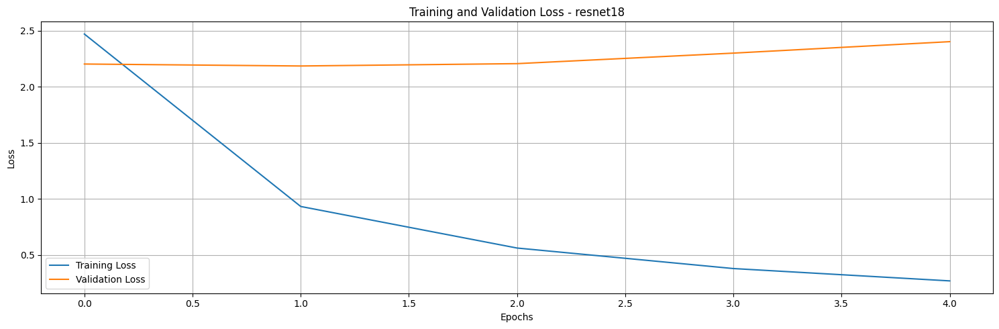



Training Model 2: resnet34 with bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

/tmp/ipykernel_31/1488235340.py:50: UserWarning: Argument(s) 'always_apply' are not valid for transform Resize
  A.Resize(config.size, config.size, always_apply=True),
/tmp/ipykernel_31/1488235340.py:51: UserWarning: Argument(s) 'always_apply' are not valid for transform Normalize
  A.Normalize(max_pixel_value=255.0, always_apply=True),


model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Epoch: 1/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 2.6959 | Valid Loss: 2.2044
Saved Best Model!
Epoch: 2/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.9012 | Valid Loss: 2.1401
Saved Best Model!
Epoch: 3/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.4978 | Valid Loss: 2.2134
Epoch: 4/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.3382 | Valid Loss: 2.2827
Epoch: 5/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.2307 | Valid Loss: 2.2907


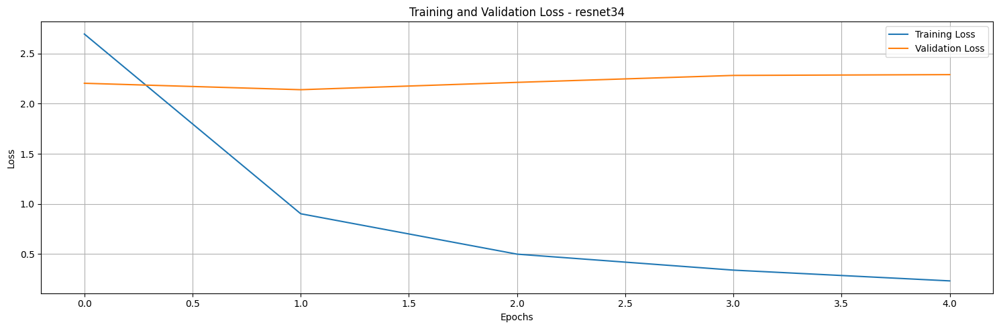



Training Model 3: resnet50 with roberta-base


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

/tmp/ipykernel_31/1488235340.py:50: UserWarning: Argument(s) 'always_apply' are not valid for transform Resize
  A.Resize(config.size, config.size, always_apply=True),
/tmp/ipykernel_31/1488235340.py:51: UserWarning: Argument(s) 'always_apply' are not valid for transform Normalize
  A.Normalize(max_pixel_value=255.0, always_apply=True),


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch: 1/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 2.4257 | Valid Loss: 2.1341
Saved Best Model!
Epoch: 2/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.7273 | Valid Loss: 2.1447
Epoch: 3/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.4269 | Valid Loss: 2.2072
Epoch: 4/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.2765 | Valid Loss: 2.2805
Epoch: 5/5


  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/253 [00:00<?, ?it/s]

Train Loss: 0.2267 | Valid Loss: 2.3513


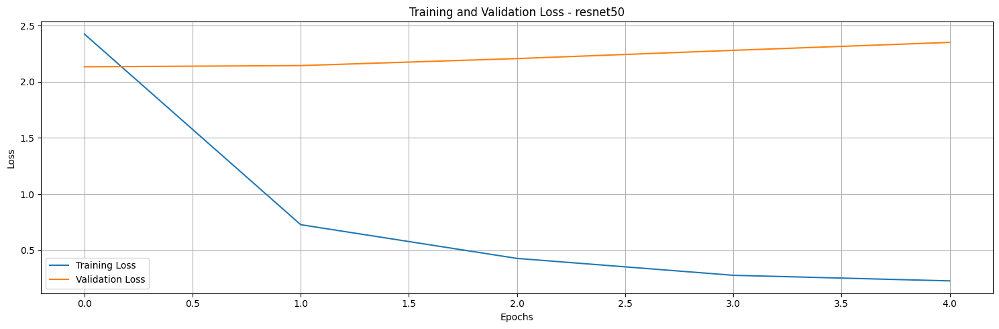

In [35]:
models = []
tokenizers = []
configs = [config1, config2, config3]

for i, config in enumerate(configs):
    print(f"\n\nTraining Model {i+1}: {config.model_name} with {config.text_encoder_model}")
    model, tokenizer, train_losses, valid_losses = train_model(config)
    models.append(model)
    tokenizers.append(tokenizer)
    
    plot_training_metrics(train_losses, valid_losses, model_name=config.model_name)

## Evaluation

We will test our model by providing it a text and asking for images that are close to it. We'll start by embedding all our images and loading the model.

## TESTING



Testing Model 1: resnet18 with distilbert-base-uncased

Results for resnet18 with distilbert-base-uncased:

Prompt: a animals running through a field
  Image: 536721406_884ab8fece.jpg, Score: 13.6610
  Image: 878758390_dd2cdc42f6.jpg, Score: 9.2400
  Image: 2925577165_b83d31a7f6.jpg, Score: 8.1985

Prompt: a busy street in a city
  Image: 543603259_ef26d9c72d.jpg, Score: 17.7407
  Image: 2925577165_b83d31a7f6.jpg, Score: 16.7624
  Image: 3517466790_17c7753a1a.jpg, Score: 8.1869
Similarity shape: (2, 10)
Number of image paths: 10


/tmp/ipykernel_31/1829464191.py:13: UserWarning: Argument(s) 'always_apply' are not valid for transform Resize
  A.Resize(config.size, config.size, always_apply=True),
/tmp/ipykernel_31/1829464191.py:14: UserWarning: Argument(s) 'always_apply' are not valid for transform Normalize
  A.Normalize(max_pixel_value=255.0, always_apply=True),


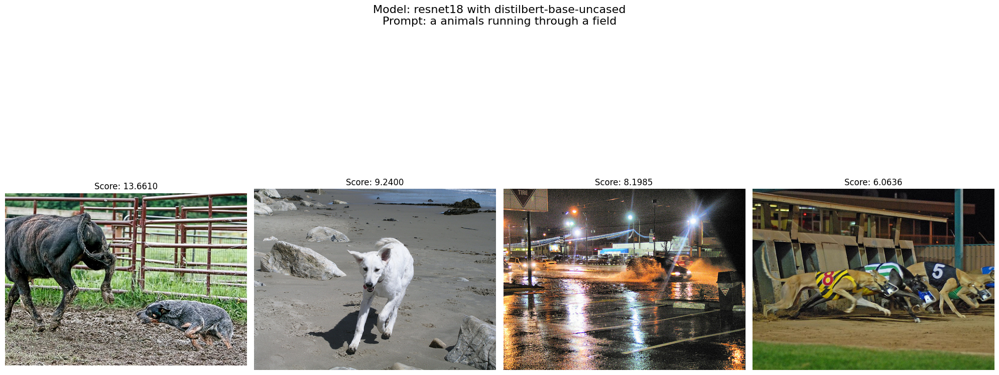

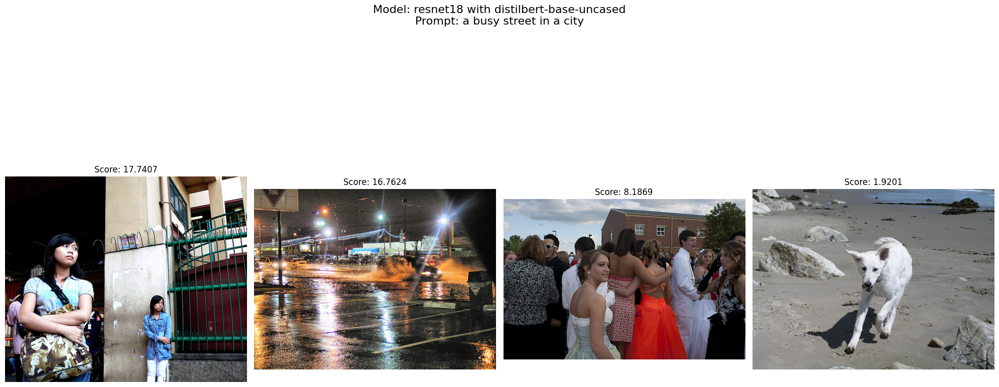



Testing Model 2: resnet34 with bert-base-uncased

Results for resnet34 with bert-base-uncased:

Prompt: a animals running through a field
  Image: 536721406_884ab8fece.jpg, Score: 16.9464
  Image: 878758390_dd2cdc42f6.jpg, Score: 8.9297
  Image: 2072574835_febf0c5fb9.jpg, Score: 8.9048

Prompt: a busy street in a city
  Image: 543603259_ef26d9c72d.jpg, Score: 13.9774
  Image: 2925577165_b83d31a7f6.jpg, Score: 12.4333
  Image: 536721406_884ab8fece.jpg, Score: 5.7617
Similarity shape: (2, 10)
Number of image paths: 10


/tmp/ipykernel_31/1829464191.py:13: UserWarning: Argument(s) 'always_apply' are not valid for transform Resize
  A.Resize(config.size, config.size, always_apply=True),
/tmp/ipykernel_31/1829464191.py:14: UserWarning: Argument(s) 'always_apply' are not valid for transform Normalize
  A.Normalize(max_pixel_value=255.0, always_apply=True),


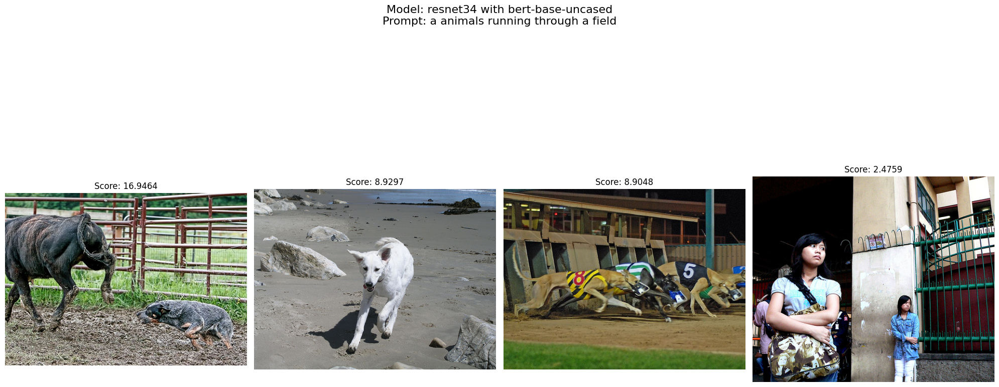

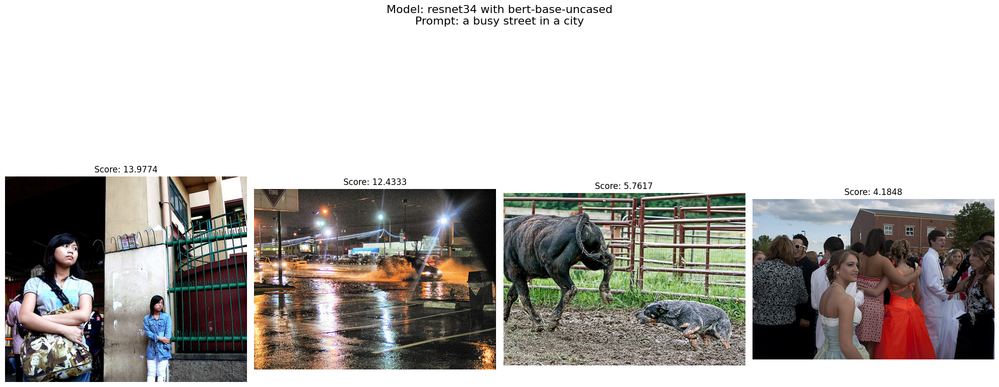



Testing Model 3: resnet50 with roberta-base

Results for resnet50 with roberta-base:

Prompt: a animals running through a field
  Image: 536721406_884ab8fece.jpg, Score: 56.1564
  Image: 878758390_dd2cdc42f6.jpg, Score: 47.1921
  Image: 3517466790_17c7753a1a.jpg, Score: 46.3016

Prompt: a busy street in a city
  Image: 2925577165_b83d31a7f6.jpg, Score: 56.3874
  Image: 543603259_ef26d9c72d.jpg, Score: 50.4308
  Image: 3517466790_17c7753a1a.jpg, Score: 45.2442
Similarity shape: (2, 10)
Number of image paths: 10


/tmp/ipykernel_31/1829464191.py:13: UserWarning: Argument(s) 'always_apply' are not valid for transform Resize
  A.Resize(config.size, config.size, always_apply=True),
/tmp/ipykernel_31/1829464191.py:14: UserWarning: Argument(s) 'always_apply' are not valid for transform Normalize
  A.Normalize(max_pixel_value=255.0, always_apply=True),


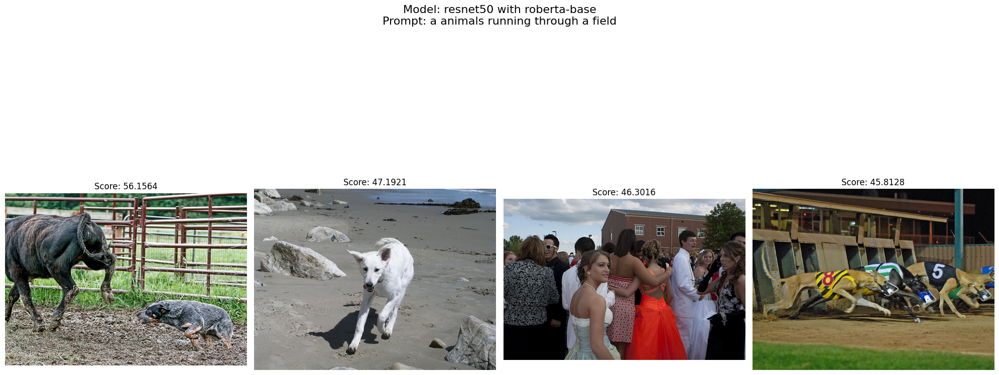

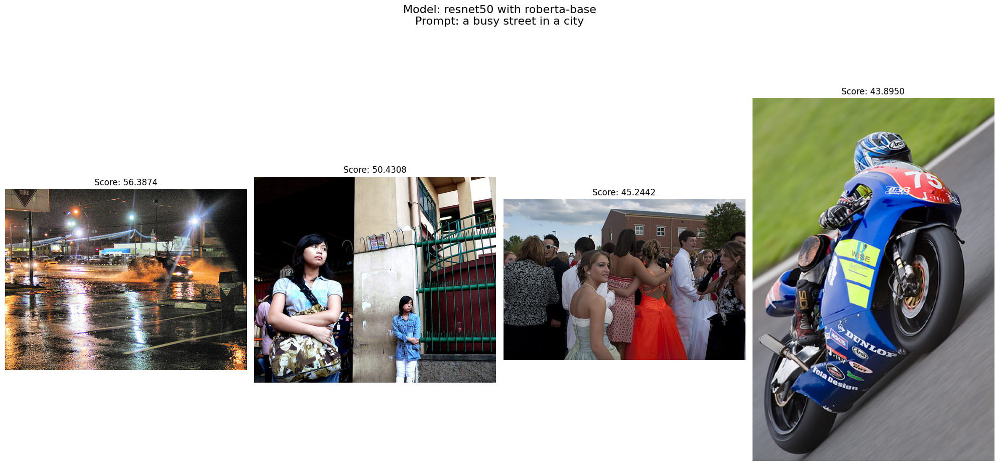

In [40]:
# Test prompts
test_prompts = [
    "a animals running through a field",
    "a busy street in a city"
]

# Function to display images with similarity scores
def display_similarity_images(similarity, image_paths, prompt_idx, config, prompt):
    plt.figure(figsize=(20, 10))
    plt.suptitle(f"Model: {config.model_name} with {config.text_encoder_model}\nPrompt: {prompt}", fontsize=16)
    
    # Get top 5 matching images
    top_indices = np.argsort(similarity[prompt_idx])[::-1][:4]
    
    for i, idx in enumerate(top_indices):
        img_path = f"{config.image_path}/{image_paths[idx]}"
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        plt.subplot(1, 4, i+1)
        plt.imshow(image)
        plt.title(f"Score: {similarity[prompt_idx][idx]:.4f}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

# Test all models with the same prompts
for i, (model, tokenizer, config) in enumerate(zip(models, tokenizers, configs)):
    print(f"\n\nTesting Model {i+1}: {config.model_name} with {config.text_encoder_model}")
    similarity, image_paths = test_model(model, tokenizer, config, test_prompts)
    print("Similarity shape:", similarity.shape)
    print("Number of image paths:", len(image_paths))

    
    # Display similarity images for each prompt
    for j, prompt in enumerate(test_prompts):
        display_similarity_images(similarity, image_paths, j, config, prompt)

## OBSERVATION

## Observations on Model Performance

After training and testing three CLIP models with different combinations of vision and text encoders, several qualitative trends emerge:

- **Model Complexity and Performance**: Increasing the scale of the vision encoder from ResNet-18 to ResNet-50 generally improves the quality of image-text matching. Larger models capture more nuanced visual features, leading to better alignment with complex or multi-object scene descriptions.

- **Text Encoder Impact**: The choice of text encoder significantly influences results. RoBERTa typically outperforms BERT and DistilBERT, especially for prompts with subtle or abstract language, resulting in more accurate image-text matching.

- **Training Efficiency**: Smaller models (e.g., ResNet-18 with DistilBERT) train faster and are more computationally efficient, making them suitable for rapid prototyping or resource-constrained environments. However, this comes at the cost of lower retrieval and classification performance compared to larger models.

- **Zero-shot Classification Capabilities**: The combination of ResNet-50 with RoBERTa demonstrates the strongest zero-shot classification abilities, often correctly identifying images matching conceptual prompts even when the exact objects or scenes were not present in the training data.

- **Image Retrieval Quality**: All models perform well on concrete, descriptive queries. However, larger models (especially ResNet-50 with RoBERTa) excel at handling abstract prompts and retrieving semantically relevant images.

- **Generalization**: Larger models show better generalization to unseen concepts, likely due to their pre-training on diverse datasets. This robustness is valuable for real-world applications where input data may differ from training distributions.

**Summary:**  
All CLIP models bridge the gap between vision and language, but the choice of encoder architecture should be guided by application requirements, balancing performance with computational cost.